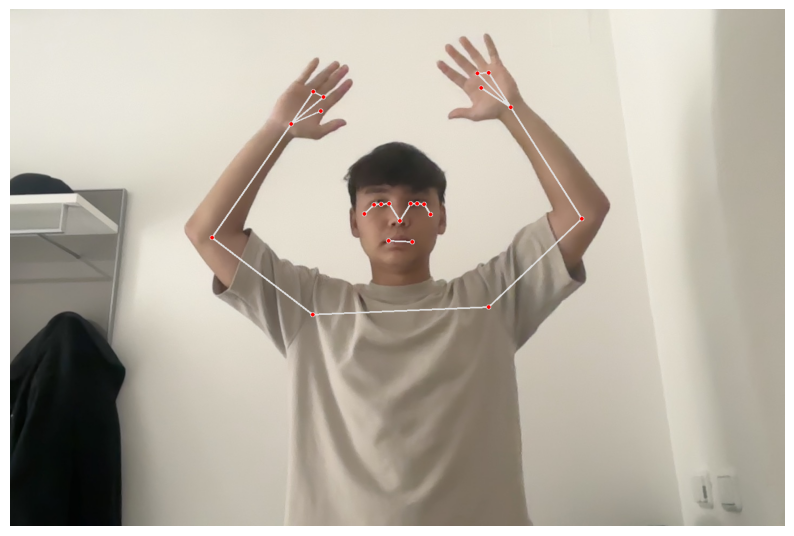

In [ ]:
import cv2
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt

mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose

def process_image(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5) as pose:
        results = pose.process(image_rgb)

        if results.pose_landmarks:
            annotated_image = image.copy()
            mp_drawing.draw_landmarks(
                annotated_image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
            return annotated_image
        else:
            return image

image_path = '/content/image.jpg'

processed_image = process_image(image_path)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [ ]:
import cv2
import mediapipe as mp
import numpy as np
from IPython.display import Video, display

mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose

def process_video(video_path, output_path='output.mp4'):
    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    with mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            results = pose.process(image_rgb)

            if results.pose_landmarks:
                mp_drawing.draw_landmarks(
                    frame, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

            out.write(frame)

    cap.release()
    out.release()

video_path = '/content/video.mov'
process_video(video_path)
display(Video('output.mp4', embed=True))
